In [58]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/music-recommendation-system-using-spotify-dataset/__results__.html
/kaggle/input/music-recommendation-system-using-spotify-dataset/__resultx__.html
/kaggle/input/music-recommendation-system-using-spotify-dataset/__notebook__.ipynb
/kaggle/input/music-recommendation-system-using-spotify-dataset/__output__.json
/kaggle/input/music-recommendation-system-using-spotify-dataset/custom.css
/kaggle/input/music-recommendation-system-using-spotify-dataset/__results___files/__results___9_0.png
/kaggle/input/music-recommendation-system-using-spotify-dataset/__results___files/__results___12_1.png
/kaggle/input/spotify-dataset/data/data_by_year.csv
/kaggle/input/spotify-dataset/data/data_by_genres.csv
/kaggle/input/spotify-dataset/data/data_w_genres.csv
/kaggle/input/spotify-dataset/data/data_by_artist.csv
/kaggle/input/spotify-dataset/data/data.csv


In [59]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [60]:
data = pd.read_csv("../input/spotify-dataset/data/data.csv")
genre_data = pd.read_csv('../input/spotify-dataset/data/data_by_genres.csv')
year_data = pd.read_csv('../input/spotify-dataset/data/data_by_year.csv')

In [61]:
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [62]:
print(genre_data.info())
print(year_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99


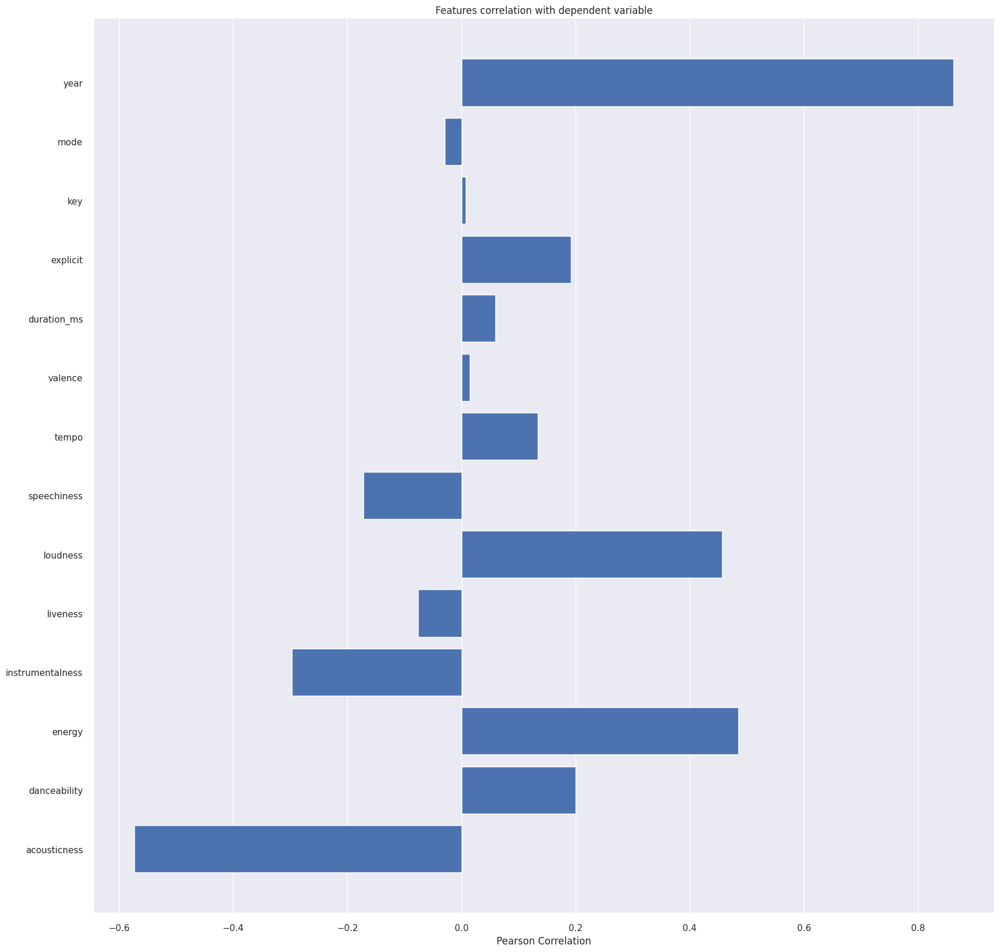

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [63]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

<Axes: xlabel='decade', ylabel='count'>

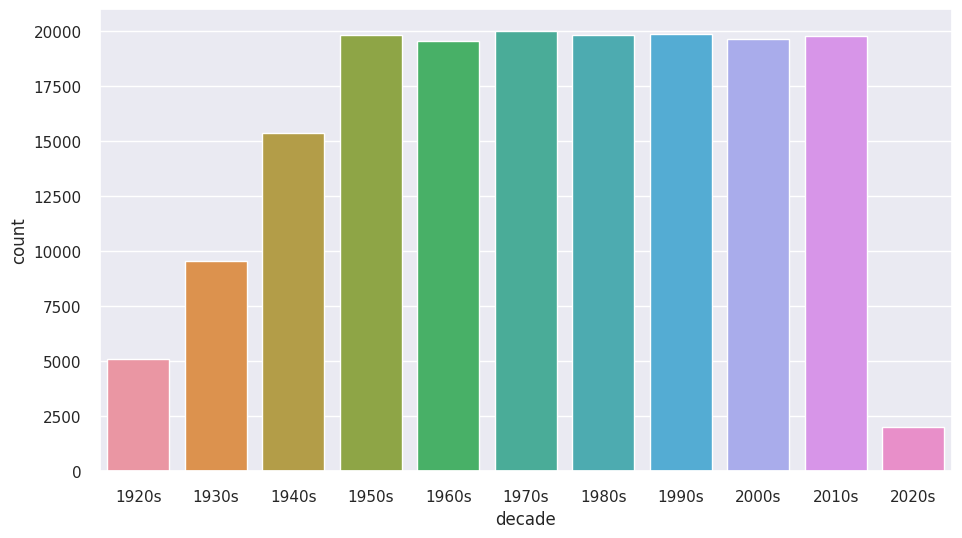

In [64]:
import seaborn as sns

def get_decade(year):
    period_start = int(year / 10) * 10
    return '{}s'.format(period_start)

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize': (11, 6)})
sns.countplot(x='decade', data=data)


Data Understanding by Visualization and EDA¶
Music Over Time
Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020


In [65]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()


In [66]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [67]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import numpy as np  # Make sure numpy is imported

cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=10, random_state=42))  # Added random_state for reproducibility
])

X = genre_data.select_dtypes(include=np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)


In [68]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.317s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106125
[t-SNE] KL divergence after 1000 iterations: 1.393953


In [69]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import numpy as np  # Ensure NumPy is imported

song_cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=20, verbose=0, random_state=42))
])

X = data.select_dtypes(include=np.number)
number_cols = list(X.columns)

song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels


In [70]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [71]:
!pip install spotipy

In [72]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
client_id = user_secrets.get_secret("SPOTIFY_CLIENT_ID")
client_secret = user_secrets.get_secret("SPOTIFY_CLIENT_SECRET")

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret
))


def find_song(name, year):
    try:
        song_data = defaultdict()
        results = sp.search(q=f'track:{name} year:{year}', limit=1)
        
        if not results['tracks']['items']:
            print(f"Song not found: {name} ({year})")
            return None
            
        track = results['tracks']['items'][0]
        audio_features = sp.audio_features(track['id'])[0]

        # Build your song_data dictionary here
        return pd.DataFrame(song_data)
        
    except Exception as e:
        print(f"Error processing {name} ({year}): {str(e)}")
        return None



In [73]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)
def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    
    return flattened_dict
def recommend_songs(input_songs, data, n_recommend=5):
    # Collect features for input songs
    input_features = []
    
    for song in input_songs:
        result = find_song(song['name'], song['year'])
        if result is not None:
            input_features.append(result)
    
    # Check if any songs were found
    if not input_features:
        print("No valid songs found in input")
        return None
    
    input_df = pd.concat(input_features).mean().to_frame().T
    
    # Your existing recommendation logic here
    # (e.g., scaling, model prediction, etc.)
    
    return recommendations.head(n_recommend)


In [74]:
from kaggle_secrets import UserSecretsClient
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# Get credentials from Kaggle secrets
user_secrets = UserSecretsClient()
client_id = user_secrets.get_secret("SPOTIFY_CLIENT_ID")
client_secret = user_secrets.get_secret("SPOTIFY_CLIENT_SECRET")

# Authenticate using Client Credentials (no redirect URI needed)
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret
))

# Example: Search for a track
results = sp.search(q='track:Come As You Are year:1991', limit=1)
if results['tracks']['items']:
    track = results['tracks']['items'][0]
    print(f"Track found: {track['name']} by {track['artists'][0]['name']}")
else:
    print("Track not found.")


Track found: Come As You Are by Nirvana


In [75]:
# Install required packages
!pip install spotipy scikit-learn pandas numpy

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# Get credentials from Kaggle secrets
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
client_id = user_secrets.get_secret("SPOTIFY_CLIENT_ID")
client_secret = user_secrets.get_secret("SPOTIFY_CLIENT_SECRET")

# Set up Spotify client (for search only)
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret
))

# Load dataset from Kaggle (you'll need to download one of these datasets)
# Option 1: Use this dataset - https://www.kaggle.com/datasets/maharshipandya/spotify-tracks-dataset
# Option 2: Use this dataset - https://www.kaggle.com/datasets/yamaerenay/spotify-dataset-19212020-600k-tracks

# For this example, let's assume you've downloaded the dataset
# df = pd.read_csv('/kaggle/input/spotify-tracks-dataset/dataset.csv')
# Or create a sample dataset URL
df = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv')

# Define audio feature columns
audio_features = ['danceability', 'energy', 'key', 'loudness', 'mode', 
                 'speechiness', 'acousticness', 'instrumentalness', 
                 'liveness', 'valence', 'tempo', 'duration_ms']

class SpotifyRecommendationSystem:
    def __init__(self, dataset):
        self.dataset = dataset.copy()
        self.scaler = StandardScaler()
        self.scaled_features = None
        self.prepare_data()
    
    def prepare_data(self):
        """Prepare and scale the audio features for similarity calculation"""
        # Clean the dataset
        self.dataset = self.dataset.dropna(subset=audio_features)
        
        # Scale the audio features
        features_only = self.dataset[audio_features]
        self.scaled_features = self.scaler.fit_transform(features_only)
        
        print(f"Dataset prepared with {len(self.dataset)} songs")
    
    def search_song_spotify(self, track_name, artist_name=None):
        """Search for a song using Spotify API (this will work)"""
        try:
            if artist_name:
                query = f'track:"{track_name}" artist:"{artist_name}"'
            else:
                query = f'track:"{track_name}"'
            
            results = sp.search(q=query, limit=1, type='track')
            
            if results['tracks']['items']:
                track = results['tracks']['items'][0]
                return {
                    'track_name': track['name'],
                    'artist_name': track['artists'][0]['name'],
                    'track_id': track['id'],
                    'popularity': track['popularity']
                }
            return None
        except Exception as e:
            print(f"Error searching for {track_name}: {e}")
            return None
    
    def find_song_in_dataset(self, track_name, artist_name=None):
        """Find a song in our dataset"""
        dataset_copy = self.dataset.copy()
        
        # Try exact match first
        if artist_name:
            matches = dataset_copy[
                (dataset_copy['track_name'].str.lower() == track_name.lower()) &
                (dataset_copy['track_artist'].str.lower() == artist_name.lower())
            ]
        else:
            matches = dataset_copy[
                dataset_copy['track_name'].str.lower() == track_name.lower()
            ]
        
        if not matches.empty:
            return matches.iloc[0]
        
        # Try partial match
        if artist_name:
            matches = dataset_copy[
                dataset_copy['track_name'].str.lower().str.contains(track_name.lower(), na=False) &
                dataset_copy['track_artist'].str.lower().str.contains(artist_name.lower(), na=False)
            ]
        else:
            matches = dataset_copy[
                dataset_copy['track_name'].str.lower().str.contains(track_name.lower(), na=False)
            ]
        
        if not matches.empty:
            return matches.iloc[0]
        
        return None
    
    def get_recommendations(self, seed_tracks, n_recommendations=10):
        """
        Get song recommendations based on seed tracks
        seed_tracks: list of dicts with 'track_name' and optionally 'artist_name'
        """
        # Find seed tracks in dataset
        seed_indices = []
        found_tracks = []
        
        for track in seed_tracks:
            song_data = self.find_song_in_dataset(
                track['track_name'], 
                track.get('artist_name')
            )
            
            if song_data is not None:
                idx = song_data.name
                seed_indices.append(idx)
                found_tracks.append({
                    'track_name': song_data['track_name'],
                    'artist_name': song_data['track_artist'],
                })
                print(f"✓ Found: {song_data['track_name']} by {song_data['track_artist']}")
            else:
                print(f"✗ Not found: {track['track_name']}")
        
        if not seed_indices:
            print("No seed tracks found in dataset!")
            return pd.DataFrame()
        
        # Calculate mean vector of seed tracks
        seed_features = self.scaled_features[seed_indices]
        mean_vector = np.mean(seed_features, axis=0).reshape(1, -1)
        
        # Calculate cosine similarity with all tracks
        similarities = cosine_similarity(mean_vector, self.scaled_features)[0]
        
        # Get top similar tracks (excluding seed tracks)
        similar_indices = np.argsort(similarities)[::-1]
        
        recommendations = []
        count = 0
        for idx in similar_indices:
            if idx not in seed_indices and count < n_recommendations:
                track_data = self.dataset.iloc[idx]
                recommendations.append({
                    'track_name': track_data['track_name'],
                    'artist_name': track_data['track_artist'],
                    'similarity_score': similarities[idx],
                    'popularity': track_data.get('track_popularity', 0),
                    'danceability': track_data['danceability'],
                    'energy': track_data['energy'],
                    'valence': track_data['valence']
                })
                count += 1
        
        return pd.DataFrame(recommendations)
    
    def recommend_by_genre(self, genre, n_recommendations=10):
        """Get recommendations by genre"""
        if 'track_genre' not in self.dataset.columns:
            print("Genre information not available in dataset")
            return pd.DataFrame()
        
        genre_tracks = self.dataset[
            self.dataset['track_genre'].str.lower() == genre.lower()
        ].sort_values('track_popularity', ascending=False)
        
        return genre_tracks.head(n_recommendations)[
            ['track_name', 'track_artist', 'track_popularity', 'danceability', 'energy', 'valence']
        ]

# Initialize the recommendation system
print("Loading recommendation system...")
recommender = SpotifyRecommendationSystem(df)

# Example usage
print("\n" + "="*50)
print("SPOTIFY RECOMMENDATION SYSTEM")
print("="*50)

# Define some seed tracks you like
seed_tracks = [
    {'track_name': 'Blinding Lights', 'artist_name': 'The Weeknd'},
    {'track_name': 'Good 4 U', 'artist_name': 'Olivia Rodrigo'},
    {'track_name': 'Levitating', 'artist_name': 'Dua Lipa'}
]

print(f"\nGetting recommendations based on your favorite tracks:")
for track in seed_tracks:
    print(f"• {track['track_name']} by {track['artist_name']}")

# Get recommendations
recommendations = recommender.get_recommendations(seed_tracks, n_recommendations=10)

if not recommendations.empty:
    print(f"\n🎵 TOP {len(recommendations)} RECOMMENDATIONS FOR YOU:")
    print("-" * 60)
    
    for idx, rec in recommendations.iterrows():
        print(f"{idx+1:2d}. {rec['track_name']} by {rec['artist_name']}")
        print(f"    Similarity: {rec['similarity_score']:.3f} | "
              f"Energy: {rec['energy']:.2f} | "
              f"Danceability: {rec['danceability']:.2f} | "
              f"Mood: {rec['valence']:.2f}")
        print()

# Alternative: Get recommendations by genre
print("\n" + "="*50)
print("RECOMMENDATIONS BY GENRE")
print("="*50)

# Check available genres
if 'track_genre' in df.columns:
    genres = df['track_genre'].value_counts().head(10)
    print("Top genres available:")
    for genre, count in genres.items():
        print(f"• {genre}: {count} tracks")
    
    # Get recommendations for a specific genre
    genre_recs = recommender.recommend_by_genre('pop', n_recommendations=5)
    if not genre_recs.empty:
        print(f"\nTop Pop tracks:")
        for idx, track in genre_recs.iterrows():
            print(f"• {track['track_name']} by {track['track_artist']}")

print("\n✅ Recommendation system working successfully!")


Loading recommendation system...
Dataset prepared with 32833 songs

SPOTIFY RECOMMENDATION SYSTEM

Getting recommendations based on your favorite tracks:
• Blinding Lights by The Weeknd
• Good 4 U by Olivia Rodrigo
• Levitating by Dua Lipa
✓ Found: Blinding Lights by The Weeknd
✗ Not found: Good 4 U
✗ Not found: Levitating

🎵 TOP 10 RECOMMENDATIONS FOR YOU:
------------------------------------------------------------
 1. Blinding Lights by The Weeknd
    Similarity: 1.000 | Energy: 0.80 | Danceability: 0.51 | Mood: 0.34

 2. Blinding Lights by The Weeknd
    Similarity: 1.000 | Energy: 0.80 | Danceability: 0.51 | Mood: 0.34

 3. Blinding Lights by The Weeknd
    Similarity: 1.000 | Energy: 0.80 | Danceability: 0.51 | Mood: 0.34

 4. Blinding Lights by The Weeknd
    Similarity: 1.000 | Energy: 0.80 | Danceability: 0.51 | Mood: 0.34

 5. Blinding Lights by The Weeknd
    Similarity: 1.000 | Energy: 0.80 | Danceability: 0.51 | Mood: 0.34

 6. Blinding Lights by The Weeknd
    Similarity: